# Dreambooth
### Notebook implementation by Joe Penna (@MysteryGuitarM on Twitter) - Improvements by David Bielejeski

### Instructions
- Sign up for RunPod here: https://runpod.io/?ref=n8yfwyum
    - Note: That's my personal referral link. Please don't use it if we are mortal enemies.

- Click *Deploy* on either `SECURE CLOUD` or `COMMUNITY CLOUD`

- Follow the rest of the instructions in this video: https://www.youtube.com/watch?v=7m__xadX0z0#t=5m33.1s

Latest information on:
https://github.com/JoePenna/Dreambooth-Stable-Diffusion

## Build Environment

In [ ]:
# If running on Vast.AI, copy the code in this cell into a new notebook. Run it, then launch the `dreambooth_runpod_joepenna.ipynb` notebook from the jupyter interface.
!git clone https://github.com/moimart/Dreambooth-Stable-Diffusion

In [6]:
# BUILD ENV
!pip install omegaconf
!pip install einops
!pip install pytorch-lightning==1.6.5
!pip install test-tube
!pip install transformers
!pip install kornia
!pip install -e git+https://github.com/CompVis/taming-transformers.git@master#egg=taming-transformers
!pip install -e git+https://github.com/openai/CLIP.git@main#egg=clip
!pip install setuptools==59.5.0
!pip install pillow==9.0.1
!pip install torchmetrics==0.6.0
!pip install -e .
!pip install protobuf==3.20
!pip install gdown
!pip install -qq diffusers["training"]==0.3.0 transformers ftfy
!pip install -qq "ipywidgets>=7,<8"
!pip install huggingface_hub
!pip install ipywidgets==7.7.1
!pip install captionizer==1.0.1
!pip install torch torchvision
!pip install torchtext==0.13.1


ERROR: Could not find a version that satisfies the requirement plotlywidgets (from versions: none)
ERROR: No matching distribution found for plotlywidgets


Obtaining taming-transformers from git+https://github.com/CompVis/taming-transformers.git@master#egg=taming-transformers
  Updating ./src/taming-transformers clone (to revision master)
  Running command git fetch -q --tags
  Running command git reset --hard -q 3ba01b241669f5ade541ce990f7650a3b8f65318
  Preparing metadata (setup.py) ... done
  Attempting uninstall: taming-transformers
    Found existing installation: taming-transformers 0.0.1
    Uninstalling taming-transformers-0.0.1:
      Successfully uninstalled taming-transformers-0.0.1
  Running setup.py develop for taming-transformers
Obtaining clip from git+https://github.com/openai/CLIP.git@main#egg=clip
  Updating ./src/clip clone (to revision main)
  Running command git fetch -q --tags
  Running command git reset --hard -q d50d76daa670286dd6cacf3bcd80b5e4823fc8e1
  Preparing metadata (setup.py) ... done
  Attempting uninstall: clip
    Found existing installation: clip 1.0
    Uninstalling clip-1.0:
      Successfully uninsta

Obtaining file:///Users/moimart/kikkei-labs/Dreambooth-Stable-Diffusion
  Preparing metadata (setup.py) ... done
  Attempting uninstall: latent-diffusion
    Found existing installation: latent-diffusion 0.0.1
    Uninstalling latent-diffusion-0.0.1:
      Successfully uninstalled latent-diffusion-0.0.1
  Running setup.py develop for latent-diffusion
zsh:1: no matches found: diffusers[training]==0.3.0


In [3]:
!jupyter nbextension enable --py --sys-prefix widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: problems found:
        - require?  X jupyter-js-widgets/extension


In [4]:
# Hugging Face Login
from huggingface_hub import notebook_login

notebook_login()

Login successful
Your token has been saved to /Users/moimart/.huggingface/token
Authenticated through git-credential store but this isn't the helper defined on your machine.
You might have to re-authenticate when pushing to the Hugging Face Hub. Run the following command in your terminal in case you want to set this credential helper as the default

git config --global credential.helper store


In [5]:
# Download the 1.4 sd model
from IPython.display import clear_output

from huggingface_hub import hf_hub_download
downloaded_model_path = hf_hub_download(
 repo_id="CompVis/stable-diffusion-v-1-4-original",
 filename="sd-v1-4.ckpt",
 use_auth_token=True
)

# Move the sd-v1-4.ckpt to the root of this directory as "model.ckpt"
actual_locations_of_model_blob = !readlink -f {downloaded_model_path}
!mv {actual_locations_of_model_blob[-1]} model.ckpt
clear_output()
print("✅ model.ckpt successfully downloaded")

✅ model.ckpt successfully downloaded


# Download pre-generated regularization images
We've created the following image sets

`man_euler` - provided by Niko Pueringer (Corridor Digital) - euler @ 40 steps, CFG 7.5
`man_unsplash` - pictures from various photographers
`person_ddim`
`woman_ddim` - provided by David Bielejeski - ddim @ 50 steps, CFG 10.0
`person_ddim` is recommended

In [6]:
#Download Regularization Images

dataset="person_ddim" #@param ["man_euler", "man_unsplash", "person_ddim", "woman_ddim", "blonde_woman"]
!git clone https://github.com/djbielejeski/Stable-Diffusion-Regularization-Images-{dataset}.git

!mkdir -p regularization_images/{dataset}
!mv -v Stable-Diffusion-Regularization-Images-{dataset}/{dataset}/*.* regularization_images/{dataset}

Cloning into 'Stable-Diffusion-Regularization-Images-person_ddim'...
remote: Enumerating objects: 1503, done.
remote: Total 1503 (delta 0), reused 0 (delta 0), pack-reused 1503
Receiving objects: 100% (1503/1503), 657.41 MiB | 21.87 MiB/s, done.
Updating files: 100% (1500/1500), done.
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00000.png -> regularization_images/person_ddim/person_ddim_00000.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00001.png -> regularization_images/person_ddim/person_ddim_00001.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00002.png -> regularization_images/person_ddim/person_ddim_00002.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00003.png -> regularization_images/person_ddim/person_ddim_00003.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00004.png -> regularization_images/person_ddim/person_ddim_0000

Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00561.png -> regularization_images/person_ddim/person_ddim_00561.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00562.png -> regularization_images/person_ddim/person_ddim_00562.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00563.png -> regularization_images/person_ddim/person_ddim_00563.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00564.png -> regularization_images/person_ddim/person_ddim_00564.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00565.png -> regularization_images/person_ddim/person_ddim_00565.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00566.png -> regularization_images/person_ddim/person_ddim_00566.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00567.png -> regularization_images/person_ddim/person_ddim_00

Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01064.png -> regularization_images/person_ddim/person_ddim_01064.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01065.png -> regularization_images/person_ddim/person_ddim_01065.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01066.png -> regularization_images/person_ddim/person_ddim_01066.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01067.png -> regularization_images/person_ddim/person_ddim_01067.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01068.png -> regularization_images/person_ddim/person_ddim_01068.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01069.png -> regularization_images/person_ddim/person_ddim_01069.png
Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_01070.png -> regularization_images/person_ddim/person_ddim_01

# Upload your training images
Upload 10-20 images of someone to

```
/workspace/Dreambooth-Stable-Diffusion/training_images
```

WARNING: Be sure to upload an *even* amount of images, otherwise the training inexplicably stops at 1500 steps.

*   2-3 full body
*   3-5 upper body
*   5-12 close-up on face

The images should be:

- as close as possible to the kind of images you're trying to make

In [10]:
#@markdown Add here the URLs to the images of the subject you are adding
urls = []
name = "sasha"

for i in range(12):
    urls.append("https://martinez.sh/training/{}_{}.png".format(name,i))
    
print(urls)

['https://martinez.sh/training/sasha_0.png', 'https://martinez.sh/training/sasha_1.png', 'https://martinez.sh/training/sasha_2.png', 'https://martinez.sh/training/sasha_3.png', 'https://martinez.sh/training/sasha_4.png', 'https://martinez.sh/training/sasha_5.png', 'https://martinez.sh/training/sasha_6.png', 'https://martinez.sh/training/sasha_7.png', 'https://martinez.sh/training/sasha_8.png', 'https://martinez.sh/training/sasha_9.png', 'https://martinez.sh/training/sasha_10.png', 'https://martinez.sh/training/sasha_11.png']


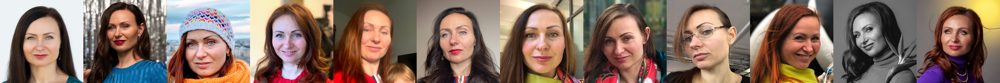

In [11]:
#@title Download and check the images you have just added
import os
import requests
from io import BytesIO
from PIL import Image


def image_grid(imgs, rows, cols):
 assert len(imgs) == rows*cols

 w, h = imgs[0].size
 grid = Image.new('RGB', size=(cols*w, rows*h))
 grid_w, grid_h = grid.size

 for i, img in enumerate(imgs):
  grid.paste(img, box=(i%cols*w, i//cols*h))
 return grid

def download_image(url):
 try:
  response = requests.get(url)
 except:
  return None
 return Image.open(BytesIO(response.content)).convert("RGB")

images = list(filter(None,[download_image(url) for url in urls]))
save_path = "./training_images"
if not os.path.exists(save_path):
 os.mkdir(save_path)
[image.save(f"{save_path}/{i}.png", format="png") for i, image in enumerate(images)]
image_grid(images, 1, len(images))

## Training

If training a person or subject, keep an eye on your project's `logs/{folder}/images/train/samples_scaled_gs-00xxxx` generations.

If training a style, keep an eye on your project's `logs/{folder}/images/train/samples_gs-00xxxx` generations.

In [12]:
# Training

# This isn't used for training, just to help you remember what your trained into the model.
project_name = "sashaproj"

# MAX STEPS
# How many steps do you want to train for?
max_training_steps = 2000

# Match class_word to the category of the regularization images you chose above.
class_word = "person" # typical uses are "man", "person", "woman"

# This is the unique token you are incorporating into the stable diffusion model.
token = "sashenka"


reg_data_root = "/workspace/Dreambooth-Stable-Diffusion/regularization_images/" + dataset

!rm -rf training_images/.ipynb_checkpoints
!python "main.py" \
 --base configs/stable-diffusion/v1-finetune_unfrozen.yaml \
 -t \
 --actual_resume "model.ckpt" \
 --reg_data_root "{reg_data_root}" \
 -n "{project_name}" \
 --gpus 0, \
 --data_root "/workspace/Dreambooth-Stable-Diffusion/training_images" \
 --max_training_steps {max_training_steps} \
 --class_word "{class_word}" \
 --token "{token}" \
 --no-test

Traceback (most recent call last):
  File "/Users/moimart/kikkei-labs/Dreambooth-Stable-Diffusion/main.py", line 2, in <module>
    from ldm.modules.pruningckptio import PruningCheckpointIO
  File "/Users/moimart/kikkei-labs/Dreambooth-Stable-Diffusion/ldm/modules/pruningckptio.py", line 1, in <module>
    from pytorch_lightning.plugins.io.torch_plugin import TorchCheckpointIO
  File "/opt/homebrew/lib/python3.10/site-packages/pytorch_lightning/__init__.py", line 30, in <module>
    from pytorch_lightning.callbacks import Callback  # noqa: E402
  File "/opt/homebrew/lib/python3.10/site-packages/pytorch_lightning/callbacks/__init__.py", line 14, in <module>
    from pytorch_lightning.callbacks.base import Callback
  File "/opt/homebrew/lib/python3.10/site-packages/pytorch_lightning/callbacks/base.py", line 25, in <module>
    from pytorch_lightning.utilities.types import STEP_OUTPUT
  File "/opt/homebrew/lib/python3.10/site-packages/pytorch_lightning/utilities/__init__.py", line 18, in 

## Copy and name the checkpoint file

In [ ]:
# Copy the checkpoint into our `trained_models` folder

directory_paths = !ls -d logs/*
last_checkpoint_file = directory_paths[-1] + "/checkpoints/last.ckpt"
training_images = !find training_images/*
date_string = !date +"%Y-%m-%dT%H-%M-%S"
file_name = date_string[-1] + "_" + project_name + "_" + str(len(training_images)) + "_training_images_" +  str(max_training_steps) + "_max_training_steps_" + token + "_token_" + class_word + "_class_word.ckpt"

file_name = file_name.replace(" ", "_")

!mkdir -p trained_models
!mv "{last_checkpoint_file}" "trained_models/{file_name}"

print("Download your trained model file from trained_models/" + file_name + " and use in your favorite Stable Diffusion repo!")

# Big Important Note!

The way to use your token is `<token> <class>` ie `joepenna person` and not just `joepenna`

## Generate Images With Your Trained Model!

In [ ]:
!python scripts/stable_txt2img.py \
 --ddim_eta 0.0 \
 --n_samples 1 \
 --n_iter 4 \
 --scale 7.0 \
 --ddim_steps 50 \
 --ckpt "/workspace/Dreambooth-Stable-Diffusion/trained_models/{file_name}" \
 --prompt "joepenna person as a masterpiece portrait painting by John Singer Sargent in the style of Rembrandt"